In [1]:
import numpy as np

In [2]:
import torch

In [3]:
import pandas as pd

In [4]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders 
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchsummary import summary              # for getting the summary of our model

%matplotlib inline

In [5]:
EPOCHS = 25
INIT_LR = 1e-3
BS = 512
default_image_size = tuple((256, 256))
image_size = 0
directory_root = '/home/stud1/surge/dataset'
width=256
height=256
depth=3

In [6]:
len(os.listdir(directory_root))

39

In [7]:
os.listdir(directory_root)

['Raspberry___healthy',
 'Tomato___healthy',
 'Grape___Esca_(Black_Measles)',
 'Tomato___Bacterial_spot',
 'Corn___Common_rust',
 'Apple___Black_rot',
 'Potato___Early_blight',
 'Pepper,_bell___Bacterial_spot',
 'Tomato___Target_Spot',
 'Pepper,_bell___healthy',
 'Strawberry___Leaf_scorch',
 'Peach___healthy',
 'Blueberry___healthy',
 'Tomato___Late_blight',
 'Tomato___Early_blight',
 'Cherry___Powdery_mildew',
 'Potato___healthy',
 'Background_without_leaves',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Tomato___Leaf_Mold',
 'Corn___Northern_Leaf_Blight',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Strawberry___healthy',
 'Cherry___healthy',
 'Apple___healthy',
 'Peach___Bacterial_spot',
 'Grape___Black_rot',
 'Apple___Cedar_apple_rust',
 'Tomato___Septoria_leaf_spot',
 'Squash___Powdery_mildew',
 'Corn___healthy',
 'Apple___Apple_scab',
 'Potato___La

In [8]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [9]:
device = get_default_device()
device

device(type='cuda')

In [10]:
Diseases= os.listdir(directory_root)
len(Diseases)

39

In [11]:
def convert_image_to_array(image_dir):
    try:
        image = cv2.imread(image_dir)
        if image is not None :
            image = cv2.resize(image, default_image_size)   
            return img_to_array(image)
        else :
            return np.array([])
    except Exception as e:
        print(f"Error : {e}")
        return None

In [12]:
root_dir = os.listdir(directory_root)
root_dir[0]

'Raspberry___healthy'

In [13]:
for plant_folder in root_dir :
        plant_disease_folder_list = os.listdir(f"{directory_root}/{plant_folder}")

In [14]:
len(plant_disease_folder_list)

5090

In [15]:
image_list, label_list=[], []

root_dir= os.listdir(directory_root)
for plant_folder in root_dir:
  plantlist= os.listdir(f"{directory_root}/{plant_folder}")

  for image in plantlist:
    image_dir= f"{directory_root}/{plant_folder}/{image}"

    if image_dir.endswith(".jpg") == True or image_dir.endswith(".JPG") == True:
      image_list.append(convert_image_to_array(image_dir))
      label_list.append(plant_folder)

Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name 'cv2' is not defined
Error : name '

In [16]:
len(image_list)

61484

In [17]:
type(image_list)

list

In [18]:
len(label_list)

61484

In [19]:
diseases= os.listdir(directory_root)

In [20]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(directory_root + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class= img_per_class.sort_index()

In [21]:
img_per_class

,no. of images
Apple___Apple_scab,1000
Apple___Black_rot,1000
Apple___Cedar_apple_rust,1000
Apple___healthy,1645
Background_without_leaves,1143
Blueberry___healthy,1502
Cherry___Powdery_mildew,1052
Cherry___healthy,1000
Corn___Cercospora_leaf_spot Gray_leaf_spot,1000
Corn___Common_rust,1192


Text(0.5, 1.0, 'Images per each class of plant disease')

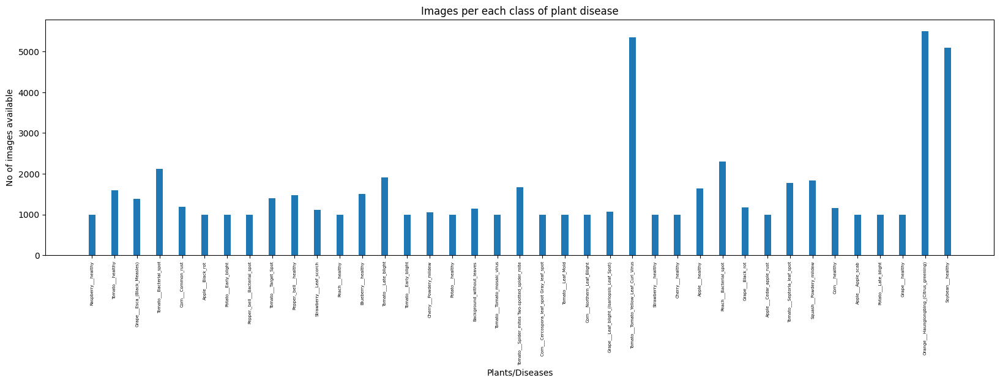

In [22]:
# plotting number of images available for each disease
index = [n for n in range(39)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=5, rotation=90)
plt.title('Images per each class of plant disease')

In [23]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 61486 images for training


In [24]:
import splitfolders

In [25]:
# import splitfolders
# splitfolders.ratio('dataset', output="output", seed=1337, ratio=(.85, 0.15)) 

In [26]:
root_dir='/home/stud1/surge/output'

In [27]:
train_Dir = root_dir + "/train"
val_Dir = root_dir + "/val"

In [28]:
Diseases = os.listdir(train_Dir)
print(Diseases)
print(len(Diseases))

['Raspberry___healthy', 'Tomato___healthy', 'Grape___Esca_(Black_Measles)', 'Tomato___Bacterial_spot', 'Corn___Common_rust', 'Apple___Black_rot', 'Potato___Early_blight', 'Pepper,_bell___Bacterial_spot', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Blueberry___healthy', 'Tomato___Late_blight', 'Tomato___Early_blight', 'Cherry___Powdery_mildew', 'Potato___healthy', 'Tomato___Tomato_mosaic_virus', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Tomato___Leaf_Mold', 'Corn___Northern_Leaf_Blight', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Strawberry___healthy', 'Cherry___healthy', 'Apple___healthy', 'Peach___Bacterial_spot', 'Grape___Black_rot', 'Apple___Cedar_apple_rust', 'Tomato___Septoria_leaf_spot', 'Squash___Powdery_mildew', 'Corn___healthy', 'Apple___Apple_scab', 'Potato___Late_blight', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_g

In [29]:
plants = []
NumberOfDiseases = 0
for plant in Diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[0] != 'healthy':
        NumberOfDiseases += 1

In [30]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Raspberry', 'Tomato', 'Grape', 'Corn', 'Apple', 'Potato', 'Pepper,_bell', 'Strawberry', 'Peach', 'Blueberry', 'Cherry', 'Squash', 'Orange', 'Soybean']


In [31]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Raspberry', 'Tomato', 'Grape', 'Corn', 'Apple', 'Potato', 'Pepper,_bell', 'Strawberry', 'Peach', 'Blueberry', 'Cherry', 'Squash', 'Orange', 'Soybean']


In [32]:
len(plants)

14

In [33]:
print("Number of diseases: {}".format(NumberOfDiseases))

Number of diseases: 38


In [34]:
# Number of images for each disease
nums = {}
for disease in Diseases:
    nums[disease] = len(os.listdir(train_Dir + '/' + disease))
print(nums)

{'Raspberry___healthy': 850, 'Tomato___healthy': 1352, 'Grape___Esca_(Black_Measles)': 1175, 'Tomato___Bacterial_spot': 1807, 'Corn___Common_rust': 1013, 'Apple___Black_rot': 850, 'Potato___Early_blight': 850, 'Pepper,_bell___Bacterial_spot': 850, 'Tomato___Target_Spot': 1193, 'Pepper,_bell___healthy': 1256, 'Strawberry___Leaf_scorch': 942, 'Peach___healthy': 850, 'Blueberry___healthy': 1276, 'Tomato___Late_blight': 1622, 'Tomato___Early_blight': 850, 'Cherry___Powdery_mildew': 894, 'Potato___healthy': 850, 'Tomato___Tomato_mosaic_virus': 850, 'Tomato___Spider_mites Two-spotted_spider_mite': 1424, 'Corn___Cercospora_leaf_spot Gray_leaf_spot': 850, 'Tomato___Leaf_Mold': 850, 'Corn___Northern_Leaf_Blight': 850, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 914, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 4553, 'Strawberry___healthy': 850, 'Cherry___healthy': 850, 'Apple___healthy': 1398, 'Peach___Bacterial_spot': 1952, 'Grape___Black_rot': 1003, 'Apple___Cedar_apple_rust': 850, 'Tomato___S

Text(0.5, 1.0, 'Images per each class of plant disease')

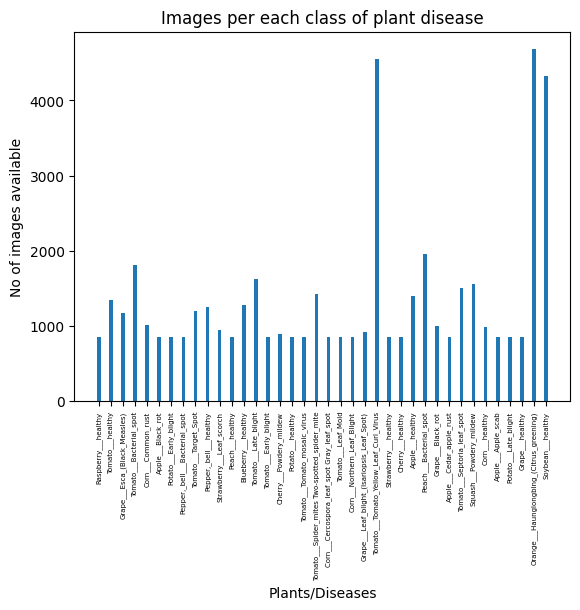

In [35]:
index = [n for n in range(38)]
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, Diseases, fontsize=5, rotation=90)
plt.title('Images per each class of plant disease')

In [36]:
add = 0
for val in nums.values():
    add += val
print(add)

51281


In [37]:
# Number of images for each disease
nums = {}
for disease in Diseases:
    nums[disease] = len(os.listdir(train_Dir + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class.sort_index()

,no. of images
Apple___Apple_scab,850
Apple___Black_rot,850
Apple___Cedar_apple_rust,850
Apple___healthy,1398
Blueberry___healthy,1276
Cherry___Powdery_mildew,894
Cherry___healthy,850
Corn___Cercospora_leaf_spot Gray_leaf_spot,850
Corn___Common_rust,1013
Corn___Northern_Leaf_Blight,850


In [38]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 51281 images for training


In [39]:
# dataset prep:

In [40]:
# datasets for validation and training
train = ImageFolder(train_Dir, transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ]))
valid = ImageFolder(val_Dir, transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ]))

In [41]:
img, label = valid[1000]
print(img.shape, label)

torch.Size([3, 256, 256]) 5


In [42]:
# total number of classes in train set
len(train.classes)

38

In [43]:
# for checking some images from training dataset
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))

Label :Apple___Apple_scab(0)


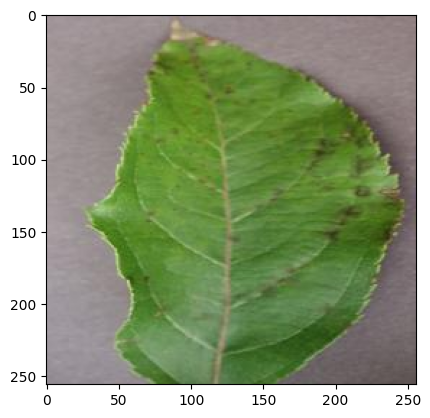

In [44]:
show_image(*train[0])

Label :Tomato___Tomato_Yellow_Leaf_Curl_Virus(35)


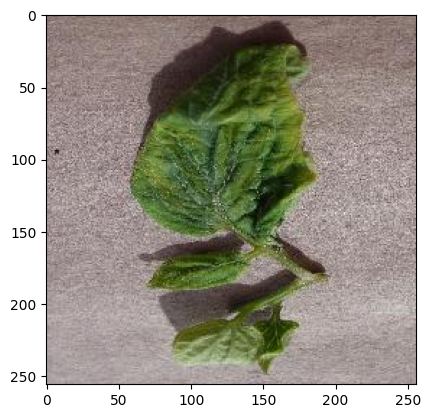

In [45]:
show_image(*train[46000])

In [46]:
# Setting the seed value
random_seed = 7
torch.manual_seed(random_seed)

In [47]:

from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

In [48]:
batch_size = 32
shuffle = True
num_workers = 4

In [49]:
# DataLoaders for training and validation
train_dl = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=False)
valid_dl = DataLoader(valid, batch_size, num_workers=2, pin_memory=False)

In [50]:
# helper function to show a batch of training instances
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

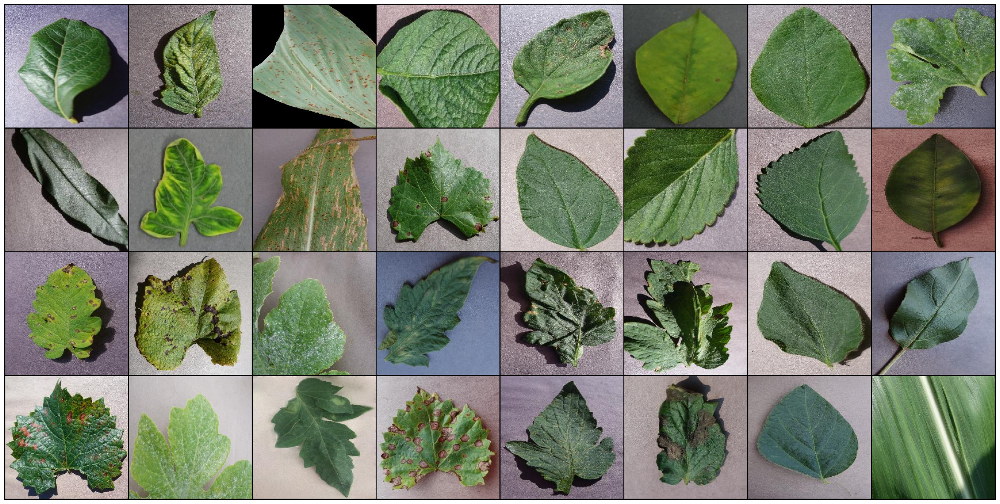

In [51]:
show_batch(train_dl)

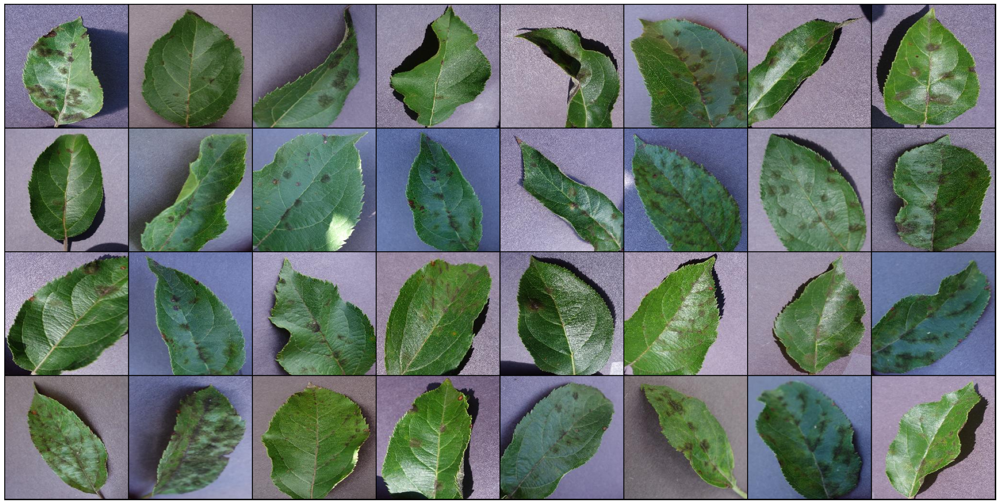

In [52]:
# Images for first batch of training
show_batch(valid_dl) 

In [53]:
torch.cuda.is_available()

True

In [54]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [55]:
device = get_default_device()
device

device(type='cuda')

In [56]:
# Moving data into GPU
train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)

In [57]:
# Residual Block code implementation

In [58]:
class SimpleResidualBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.conv2(out)
        return self.relu2(out) + x # ReLU can be applied before or after adding the input

In [59]:

# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))


# base class for the model
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}
    
    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss  
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_accuracy']))

In [60]:
# Architecture for training

# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)


# resnet architecture 
class ResNet9(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()
        
        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) # out_dim : 128 x 64 x 64 
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))
        
        self.conv3 = ConvBlock(128, 256, pool=True) # out_dim : 256 x 16 x 16
        self.conv4 = ConvBlock(256, 512, pool=True) # out_dim : 512 x 4 x 44
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))
        
    def forward(self, xb): # xb is the loaded batch
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

In [61]:
# defining the model and moving it to the GPU
model = to_device(ResNet9(3, len(train.classes)), device) 
model

ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

In [62]:
# getting summary of the model
INPUT_SHAPE = (3, 256, 256)
print(summary(model, (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14          [-1, 256,

In [63]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    

def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))
    
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
                
            optimizer.step()
            optimizer.zero_grad()
            
            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
            
    
        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        
    return history


In [64]:
%%time
history = [evaluate(model, valid_dl)]
history

CPU times: user 24.7 s, sys: 867 ms, total: 25.5 s
Wall time: 25.7 s


[{'val_loss': tensor(3.6361, device='cuda:0'), 'val_accuracy': tensor(0.0321)}]

In [65]:
epochs = 10
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [66]:
%%time
history += fit_OneCycle(epochs, max_lr, model, train_dl, valid_dl, 
                             grad_clip=grad_clip, 
                             weight_decay=1e-4, 
                             opt_func=opt_func)


Epoch [0], last_lr: 0.00280, train_loss: 0.6490, val_loss: 0.8124, val_acc: 0.7721
Epoch [1], last_lr: 0.00760, train_loss: 0.4146, val_loss: 1.2639, val_acc: 0.6819
Epoch [2], last_lr: 0.01000, train_loss: 0.3008, val_loss: 0.9231, val_acc: 0.7743
Epoch [3], last_lr: 0.00950, train_loss: 0.2727, val_loss: 0.2290, val_acc: 0.9217
Epoch [4], last_lr: 0.00812, train_loss: 0.1985, val_loss: 0.1991, val_acc: 0.9379
Epoch [5], last_lr: 0.00611, train_loss: 0.1450, val_loss: 0.2422, val_acc: 0.9213
Epoch [6], last_lr: 0.00389, train_loss: 0.0955, val_loss: 0.2033, val_acc: 0.9342
Epoch [7], last_lr: 0.00188, train_loss: 0.0536, val_loss: 0.0416, val_acc: 0.9865
Epoch [8], last_lr: 0.00050, train_loss: 0.0222, val_loss: 0.0273, val_acc: 0.9915
Epoch [9], last_lr: 0.00000, train_loss: 0.0095, val_loss: 0.0242, val_acc: 0.9916
CPU times: user 1h 17min 50s, sys: 1min 4s, total: 1h 18min 54s
Wall time: 1h 19min 13s


In [72]:
def plot_accuracies(history):
    accuracies = [x['val_accuracy'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');

def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');
    
def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');

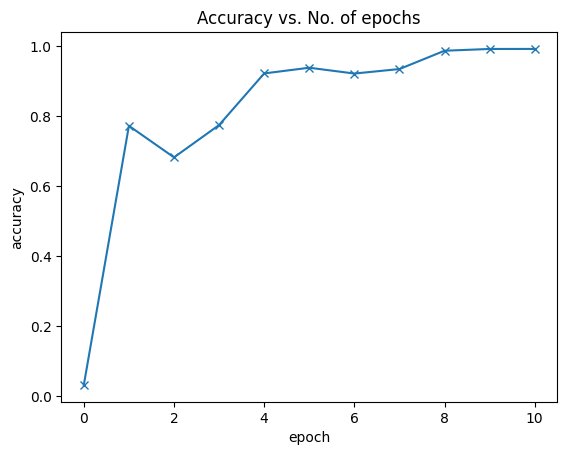

In [73]:
plot_accuracies(history)

In [74]:
# plot_losses(history)

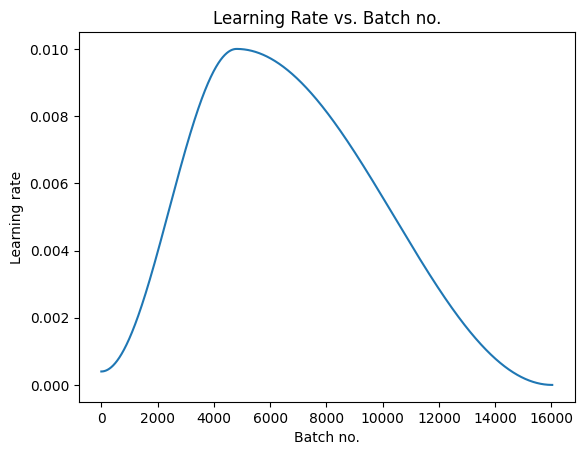

In [75]:
plot_lrs(history)

In [71]:
# saving to the kaggle working directory
PATH = '/home/stud1/surge/model/plant-disease-model1.pth'  
torch.save(model.state_dict(), PATH)

In [83]:
import pickle

In [85]:
with open('history-m1', 'wb') as f: 
    pickle.dump(history, f) 

In [87]:
# history